# Spatial gradients in Xenium breast cancer tumor

In [1]:
import sys
import os
from collections import defaultdict
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from glmpca import glmpca
from itertools import combinations
import torch

import sys
from importlib import reload

import gaston
from gaston import neural_net,cluster_plotting, dp_related, segmented_fit, restrict_spots, model_selection
from gaston import binning_and_plotting, isodepth_scaling, run_slurm_scripts, parse_adata
from gaston import spatial_gene_classification, plot_cell_types, filter_genes, process_NN_output

import seaborn as sns
import math

## Step 1: pre-processing

Download data from here: https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip

In [2]:
!mkdir -p xenium_brca_tutorial_outputs

In [16]:
# CHANGE TO: location of Xenium data folder
folder='/n/fs/ragr-data/datasets/xenium/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs/outs/'
counts_mat,coords_mat,gene_labels,cell_types=parse_adata.get_gaston_input_xenium(folder, filter_zero_cells=True)

/n/fs/ragr-data/users/uchitra/miniconda3/envs/gaston-package/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


### Option 1: run GLM-PCA (recommended)

This step takes around 20-30 minutes. This is more time than option 2 (analytic Pearson residuals) but is recommended for better results.

In [26]:
# GLM-PCA parameters
num_dims=20
penalty=1

# CHANGE THESE PARAMETERS TO REDUCE RUNTIME
num_iters=30
eps=1e-4
num_genes=10000

counts_mat_glmpca=counts_mat[:,np.argsort(np.sum(counts_mat, axis=0))[-num_genes:]]
glmpca_res=glmpca.glmpca(counts_mat_glmpca.T, num_dims, fam="poi", penalty=penalty, verbose=True,
                        ctl = {"maxIter":num_iters, "eps":eps, "optimizeTheta":True})
A = glmpca_res['factors'] # should be of size N x num_dims, where each column is a PC

np.save('xenium_tumor_data/glmpca.npy', A)

Iteration: 0 | deviance=6.5688E+7
Iteration: 1 | deviance=6.5639E+7
Iteration: 2 | deviance=3.7323E+7
Iteration: 3 | deviance=3.0605E+7
Iteration: 4 | deviance=2.8975E+7
Iteration: 5 | deviance=2.8208E+7
Iteration: 6 | deviance=2.7779E+7
Iteration: 7 | deviance=2.7504E+7
Iteration: 8 | deviance=2.7309E+7
Iteration: 9 | deviance=2.7162E+7
Iteration: 10 | deviance=2.7047E+7
Iteration: 11 | deviance=2.6954E+7
Iteration: 12 | deviance=2.6877E+7
Iteration: 13 | deviance=2.6813E+7
Iteration: 14 | deviance=2.6759E+7
Iteration: 15 | deviance=2.6712E+7
Iteration: 16 | deviance=2.6671E+7
Iteration: 17 | deviance=2.6635E+7
Iteration: 18 | deviance=2.6603E+7
Iteration: 19 | deviance=2.6575E+7
Iteration: 20 | deviance=2.6549E+7
Iteration: 21 | deviance=2.6526E+7
Iteration: 22 | deviance=2.6505E+7
Iteration: 23 | deviance=2.6486E+7
Iteration: 24 | deviance=2.6468E+7
Iteration: 25 | deviance=2.6452E+7
Iteration: 26 | deviance=2.6437E+7
Iteration: 27 | deviance=2.6423E+7
Iteration: 28 | deviance=2.641

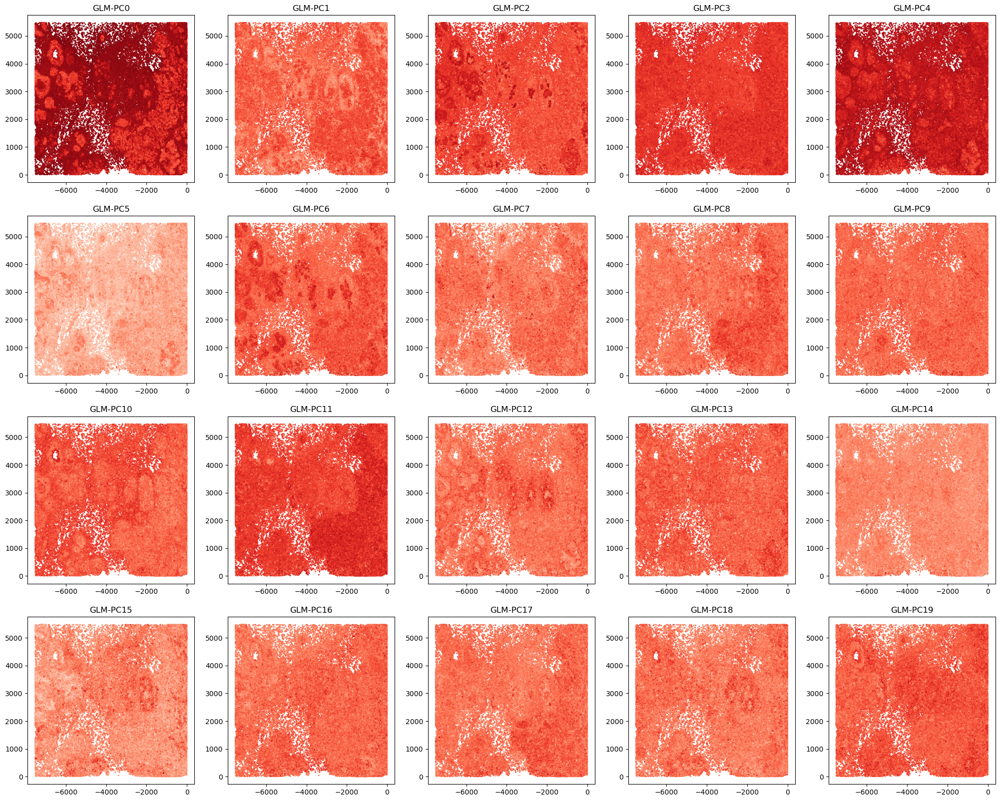

In [27]:
# visualize top GLM-PCs
R=4
C=5
fig,axs=plt.subplots(R,C,figsize=(C*5, R*5))
for r in range(R):
    for c in range(C):
        i=r*C+c
        axs[r,c].scatter(-1*coords_mat[:,0], coords_mat[:,1], c=A[:,i],cmap='Reds',s=1)
        axs[r,c].set_title(f'GLM-PC{i}')

### Option 2: use PCs of analytic Pearson residuals

In [24]:
num_dims=20
clip=0.01 # have to clip values to be very small!

A = parse_adata.get_top_pearson_residuals(num_dims,counts_mat,coords_mat,clip=clip)

np.save('xenium_tumor_data/analytic_pearson.npy', A)

/n/fs/ragr-data/users/uchitra/miniconda3/envs/gaston-package/lib/python3.11/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/n/fs/ragr-data/users/uchitra/miniconda3/envs/gaston-package/lib/python3.11/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/n/fs/ragr-data/users/uchitra/miniconda3/envs/gaston-package/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/n/fs/ragr-data/users/uchitra/miniconda3/envs/gaston-package/lib/python3.11/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a

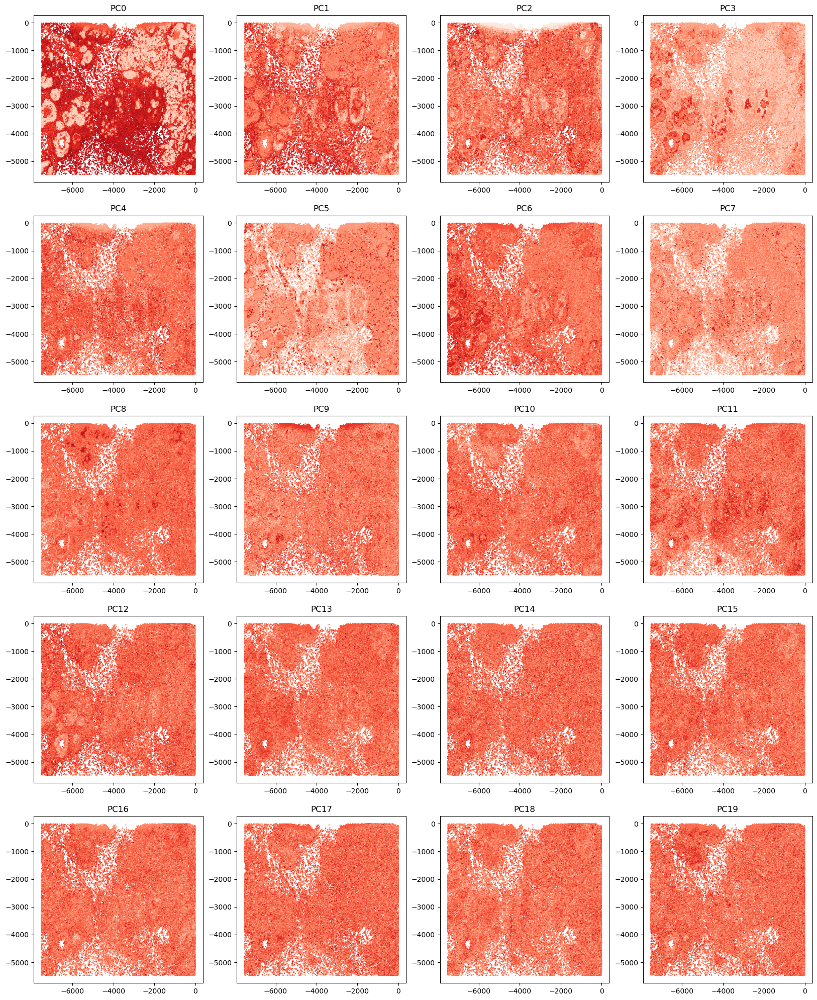

In [22]:
# visualize top GLM-PCs
R=5
C=4
fig,axs=plt.subplots(R,C,figsize=(5*C,5*R))
for r in range(R):
    for c in range(C):
        i=r*C+c
        axs[r,c].scatter(-1*coords_mat[:,0], -1*coords_mat[:,1], c=A[:,i],cmap='Reds',s=0.5)
        axs[r,c].set_title(f'PC{i}')

## Step 1.5 (dataset-specific): extract atypical ductal hyperplasia (ADH) crop of tissue

We will extract a crop of the tissue corresponding to the ADH region of the tissue. This is custom code for this specific dataset.

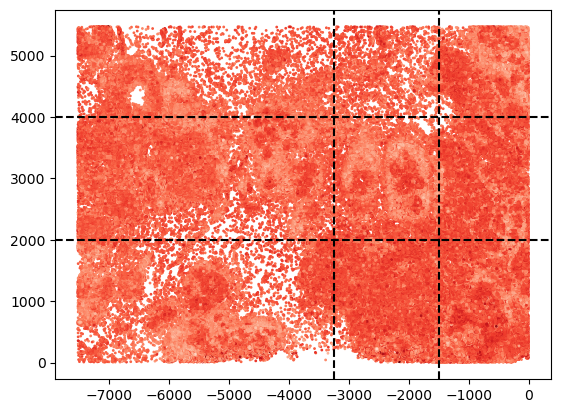

In [28]:
# choose x and y limits
xmax=3250
xmin=1500

ymin=2000
ymax=4000

# visualize cropped region
plt.scatter(-1*coords_mat[:,0], coords_mat[:,1], c=A[:,1],cmap='Reds',s=1)

plt.axvline(-1*xmax,ls='--',color='black')
plt.axvline(-1*xmin,ls='--',color='black')

plt.axhline(ymax,ls='--',color='black')
plt.axhline(ymin,ls='--',color='black')

In [30]:
# save cropped region

pts_bounded=np.where( (coords_mat[:,0] > xmin) & (coords_mat[:,0] < xmax) & 
                     (coords_mat[:,1] > ymin) & (coords_mat[:,1] < ymax) )[0]

counts_mat_bounded=counts_mat[pts_bounded,:]
coords_mat_bounded=coords_mat[pts_bounded,:]
pcs_bounded=A[pts_bounded,:]
cell_types_bounded=cell_types[pts_bounded]

np.save('xenium_tumor_data/coords_mat_bounded.npy', coords_mat_bounded)
np.save('xenium_tumor_data/glmpca_bounded.npy', pcs_bounded)
np.save('xenium_tumor_data/cell_labels_bounded.npy', cell_types_bounded)
np.save('xenium_tumor_data/counts_mat_bounded.npy', counts_mat[pts_bounded,:])
np.save('xenium_tumor_data/gene_labels.npy', gene_labels)

## Step 2: Train GASTON network

We include how to train the neural network with two options: (1) a command line script and (2) in a notebook. We typically train the neural network 30 different times, each with a different seed, and we use the NN with lowest loss. 

### Option 1: Slurm

For option (1), the code below creates 30 different Slurm jobs, one for each initialization. To train the NN for a single initialization run the following command:

`gaston -i /path/to/coords.npy -o /path/to/glmpca.npy -d /path/to/output_dir -e 10000 -c 500 -p 20 20 -x 20 20 -z adam -s SEED`

for a given `SEED` value (integer)

NOTE: please wait for models to finish training before running below code. You can check on their status by running `squeue -u uchitra` (replacing `uchitra` with your username)

In [65]:
# Load data generated above
path_to_coords='xenium_tumor_data/coords_mat_bounded.npy'
path_to_glmpca='xenium_tumor_data/glmpca_bounded.npy'

# NN parameters
epochs = 100000 # number of epochs to train NN, lower for shorter runtime (eg use 20000 if you want to run in 5-10 min)
time="0-01:00:00" # limit slurm jobs to 1hr

isodepth_arch=[20,20] # architecture (two hidden layers of size 20) for isodepth neural network d(x,y)
expression_arch=[20,20] # architecture (two hidden layers of size 20) for 1-D expression function
checkpoint = 500 # save model after number of epochs = multiple of checkpoint
optimizer = "adam"
num_restarts=30 # number of initializations

output_dir='xenium_brca_tutorial_outputs' # folder to save model runs
conda_environment='gaston-package'
path_to_conda_folder='/n/fs/ragr-data/users/uchitra/miniconda3/bin/activate'

run_slurm_scripts.train_NN_parallel(path_to_coords, path_to_glmpca, isodepth_arch, expression_arch, 
                      output_dir, conda_environment, path_to_conda_folder,
                      epochs=epochs, checkpoint=checkpoint, 
                      num_seeds=num_restarts,time=time)

jobId: 20575781
jobId: 20575782
jobId: 20575783
jobId: 20575784
jobId: 20575785
jobId: 20575786
jobId: 20575787
jobId: 20575788
jobId: 20575789
jobId: 20575790
jobId: 20575791
jobId: 20575792
jobId: 20575793
jobId: 20575794
jobId: 20575795
jobId: 20575796
jobId: 20575797
jobId: 20575798
jobId: 20575799
jobId: 20575800
jobId: 20575801
jobId: 20575802
jobId: 20575803
jobId: 20575804
jobId: 20575805
jobId: 20575806
jobId: 20575807
jobId: 20575808
jobId: 20575809
jobId: 20575810


### Option 2: train in notebook

In [ ]:
path_to_coords='xenium_tumor_data/coords_mat_bounded.npy'
path_to_glmpca='xenium_tumor_data/glmpca_bounded.npy'

A=np.load(path_to_glmpca)
S=np.load(path_to_coords)

# z-score normalize S and A
S_torch, A_torch = neural_net.load_rescale_input_data(S,A)

In [ ]:
######################################
# NEURAL NET PARAMETERS (USER CAN CHANGE)
# architectures are encoded as list, eg [20,20] means two hidden layers of size 20 hidden neurons
isodepth_arch=[20,20] # architecture for isodepth neural network d(x,y) : R^2 -> R 
expression_fn_arch=[20,20] # architecture for 1-D expression function h(w) : R -> R^G

num_epochs = 200000 # number of epochs to train NN (NOTE: it is sometimes beneficial to train longer)
checkpoint = 500 # save model after number of epochs = multiple of checkpoint
out_dir='xenium_brca_tutorial_outputs' # folder to save model runs
optimizer = "adam"
num_restarts=30
device='cuda' # change to 'cpu' if you don't have a GPU

######################################

seed_list=range(num_restarts)
for seed in seed_list:
    print(f'training neural network for seed {seed}')
    out_dir_seed=f"{out_dir}/rep{seed}"
    os.makedirs(out_dir_seed, exist_ok=True)
    mod, loss_list = neural_net.train(S_torch, A_torch,
                          S_hidden_list=isodepth_arch, A_hidden_list=expression_fn_arch, 
                          epochs=num_epochs, checkpoint=checkpoint, device=device,
                          save_dir=out_dir_seed, optim=optimizer, seed=seed, save_final=True)

## Step 3: process GASTON output

We note that plots may differ from those in the main text due to non-determinism of PyTorch training.

In [79]:
gaston_model, A, S= process_NN_output.process_files('xenium_brca_tutorial_outputs') # model trained above


# May need to re-load data
counts_mat=np.load('xenium_tumor_data/counts_mat_bounded.npy',allow_pickle=True)
coords_mat=np.load('xenium_tumor_data/coords_mat_bounded.npy',allow_pickle=True)
gene_labels=np.load('xenium_tumor_data/gene_labels.npy',allow_pickle=True)
cell_labels_bounded=np.load('xenium_tumor_data/cell_labels_bounded.npy',allow_pickle=True)

best model: xenium_brca_tutorial_outputs/seed11


**Model selection** for choosing number of domains

Kneedle number of domains: 4


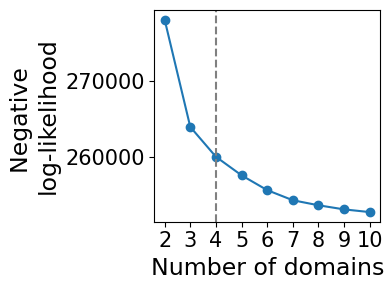

In [81]:
model_selection.plot_ll_curve(gaston_model, A, S, max_domain_num=10, start_from=2)

In [82]:
num_layers=4 # CHANGE FOR YOUR APPLICATION (use number of layers from above)
gaston_isodepth, gaston_labels=dp_related.get_isodepth_labels(gaston_model,A,S,num_layers)

# DATASET-SPECIFIC: so domains are ordered outer to inner
gaston_isodepth=np.max(gaston_isodepth) - gaston_isodepth
gaston_labels=(num_layers-1)-gaston_labels

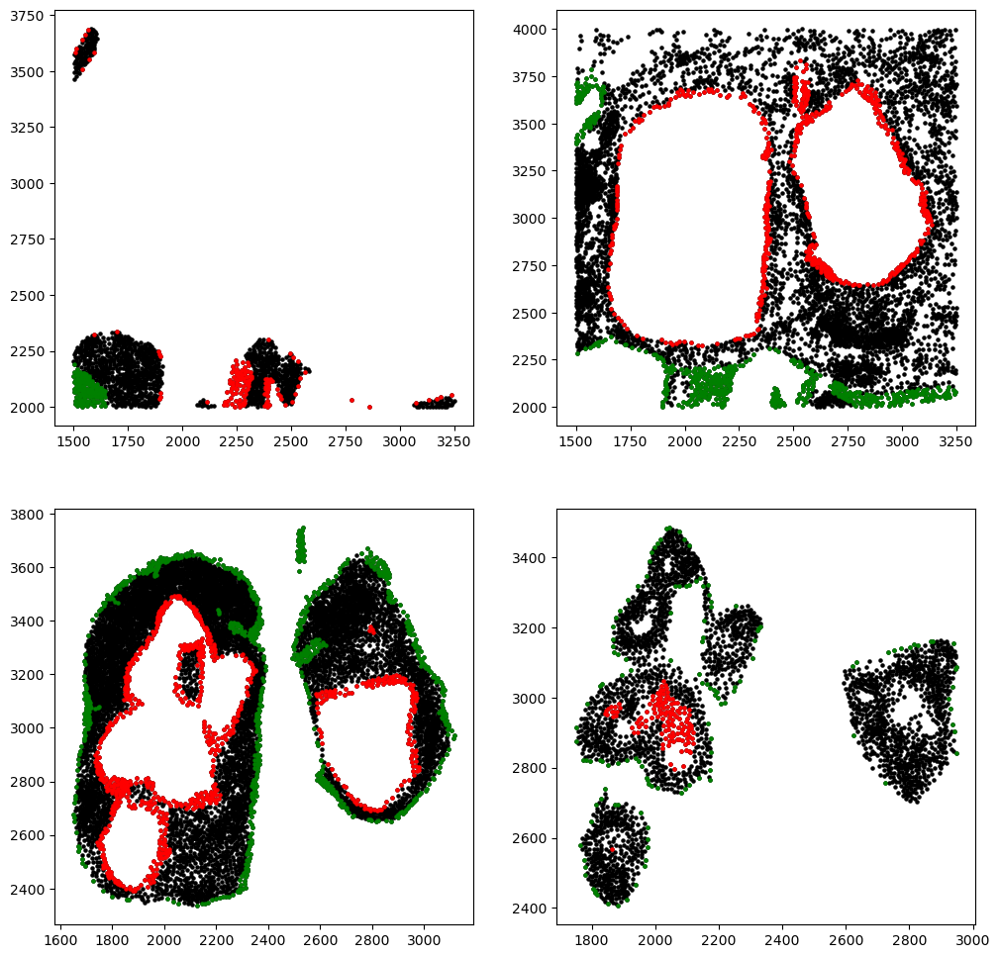

In [83]:
# WITH VISUALIZATION
gaston_isodepth,scaling_factors=isodepth_scaling.adjust_isodepth(gaston_isodepth, gaston_labels, coords_mat, num_domains=num_layers,
                                 q_vals=[0.1,0.1,0.1,0.05], visualize=True, figsize=(12,12),num_rows=2,
                                                return_scaling_factors=True)

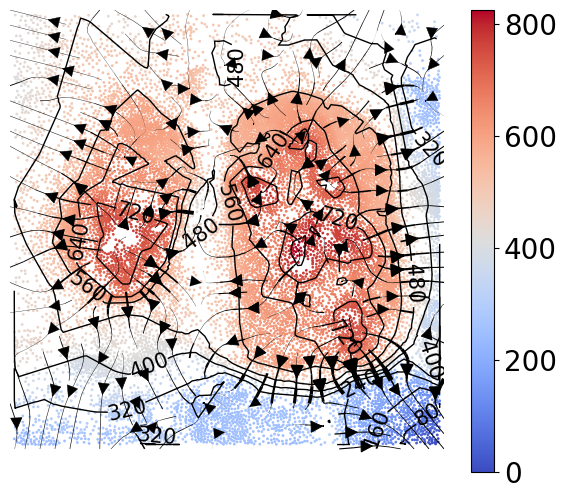

In [84]:
show_streamlines=True

linear_transform=np.array([[-1,0],[0,1]]) # reflect points across x axis
cluster_plotting.plot_isodepth(gaston_isodepth, S, gaston_model, 
                               figsize=(7,6), streamlines=show_streamlines, s=1,
                              scaling_factors=scaling_factors,
                              gaston_labels_for_scaling=gaston_labels,
                              streamlines_lw=2, contour_levels=10, 
                               cbar_fs=20, contour_fs=15,
                               linear_transform=linear_transform)

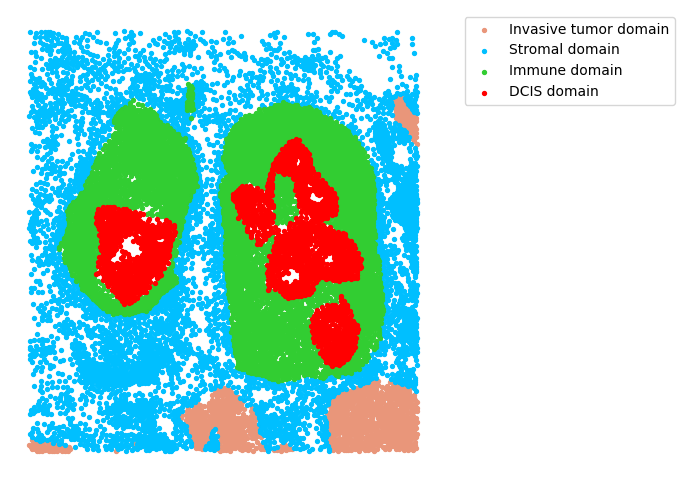

In [85]:
layer_colors=['darksalmon', 'deepskyblue', 'limegreen', 'red']
labels=['Invasive tumor domain', 'Stromal domain', 'Immune domain', 'DCIS domain']

cluster_plotting.plot_clusters(gaston_labels, S, figsize=(5.5,6), colors=layer_colors, 
                               s=8, lgd=True, labels=labels,
                              bbox_to_anchor=(1.05,1),linear_transform=linear_transform)

### Cell types vs isodepth

In [93]:
cell_type_df=process_NN_output.create_cell_type_df(cell_labels_bounded)
cell_type_df

,B_Cells,CD4+_T_Cells,CD8+_T_Cells,DCIS_1,DCIS_2,Endothelial,IRF7+_DCs,Invasive_Tumor,LAMP3+_DCs,Macrophages_1,Macrophages_2,Mast_Cells,Myoepi_ACTA2+,Myoepi_KRT15+,Perivascular-Like,Prolif_Invasive_Tumor,Stromal,Stromal_&_T_Cell_Hybrid,T_Cell_&_Tumor_Hybrid,Unlabeled
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16616,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16617,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16618,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


(7, 31) ['CD8+_T_Cells', 'CD4+_T_Cells', 'Invasive_Tumor', 'DCIS_2', 'Myoepi_ACTA2+', 'Stromal', 'B_Cells']


Text(0, 0.5, 'Cell type proportion')

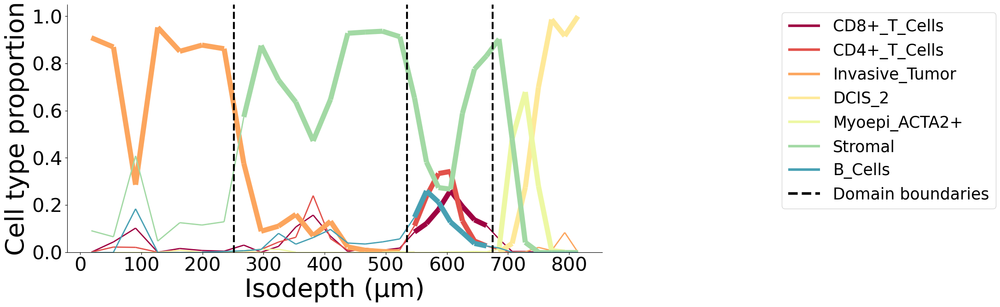

In [108]:
ct_colors={'CD8+_T_Cells': 'gold',
           'Invasive_Tumor': 'darkorange',
           'B_Cells': 'forestgreen',
           'Myoepi_ACTA2+': 'darkturquoise',
           'DCIS_2': 'orangered',
           'CD4+_T_Cells': 'darkviolet',
           'Endothelial': 'palegreen',
           'Stromal': 'dodgerblue'}

plot_cell_types.plot_ct_props(cell_type_df, gaston_labels, gaston_isodepth, 
                              num_bins_per_domain=[7,10,7,7], ct_colors=None,
                              include_lgd=True, figsize=(15,7), ticksize=30, width1=8, width2=2, 
                              domain_ct_threshold=0.7)
plt.xlabel('Isodepth (µm)', fontsize=40)
plt.ylabel('Cell type proportion', fontsize=40)

### Spatially varying gene analysis

In [114]:
# Cell types for which to compute cell type-specific expression functions.
# ct_list=[] # USE THIS EITHER: (1) for speed if you don't care about cell type specific effects or (2) you don't have cell type dict
ct_list=plot_cell_types.domain_cts_svg(cell_type_df, gaston_labels, gaston_isodepth, domain_ct_threshold=0.7)

print(f'Cell types to compute expression functions for: {ct_list}')

# if you want to get rid of warnings
import warnings
warnings.filterwarnings("ignore")

# Piecewise linear fit parameters
t=0.1 # set slope=0 if LLR p-value > 0.1
umi_threshold=500 # only compute fit for genes with total UMI > 500
zero_fit_threshold=0 # xenium is not sparse so can compute for all cell types

pw_fit_dict=segmented_fit.pw_linear_fit(counts_mat, gaston_labels, gaston_isodepth, 
                                          cell_type_df, ct_list, zero_fit_threshold=zero_fit_threshold,
                                        t=t,umi_threshold=umi_threshold,
                                       isodepth_mult_factor=0.1) # isodepth_mult_factor for stability, if range of isodepth values is too large

Cell types to compute expression functions for: ['B_Cells' 'CD4+_T_Cells' 'CD8+_T_Cells' 'DCIS_2' 'Invasive_Tumor'
 'Myoepi_ACTA2+' 'Stromal']
Poisson regression for ALL cell types


100%|██████████| 280/280 [00:09<00:00, 28.34it/s]


Poisson regression for cell type: B_Cells


100%|██████████| 280/280 [00:05<00:00, 54.34it/s]


Poisson regression for cell type: CD4+_T_Cells


100%|██████████| 280/280 [00:03<00:00, 72.85it/s]


Poisson regression for cell type: CD8+_T_Cells


100%|██████████| 280/280 [00:06<00:00, 41.25it/s]


Poisson regression for cell type: DCIS_2


100%|██████████| 280/280 [00:02<00:00, 133.76it/s]


Poisson regression for cell type: Invasive_Tumor


100%|██████████| 280/280 [00:04<00:00, 58.01it/s]


Poisson regression for cell type: Myoepi_ACTA2+


100%|██████████| 280/280 [00:02<00:00, 131.37it/s]


Poisson regression for cell type: Stromal


100%|██████████| 280/280 [00:08<00:00, 34.14it/s]


In [118]:
binning_output=binning_and_plotting.bin_data(counts_mat.T, gaston_labels, gaston_isodepth, 
                         cell_type_df, gene_labels, num_bins_per_domain=[7,10,7,7], umi_threshold=umi_threshold)
domain_cts=plot_cell_types.get_domain_cts(binning_output, 0.7)

In [120]:
discont_genes_layer=spatial_gene_classification.get_discont_genes(pw_fit_dict, binning_output)

cont_genes_layer=spatial_gene_classification.get_cont_genes(pw_fit_dict, binning_output, q=0.9)

cont_genes_ct=spatial_gene_classification.get_cont_genes(pw_fit_dict, binning_output, ct_attributable=True, domain_cts=domain_cts,q=0.9)
cont_genes_ct

{'ABCC11': [(1, 'Stromal')],
 'ADH1B': [(2, 'Stromal'),
  (2, 'CD4+_T_Cells'),
  (2, 'CD8+_T_Cells'),
  (2, 'B_Cells')],
 'AQP1': [(0, 'Other')],
 'AR': [(1, 'Stromal')],
 'AVPR1A': [(1, 'Stromal')],
 'BANK1': [(0, 'Other'), (2, 'Stromal'), (2, 'CD4+_T_Cells')],
 'BTNL9': [(0, 'Invasive_Tumor')],
 'C15orf48': [(2, 'Stromal'),
  (2, 'CD4+_T_Cells'),
  (2, 'CD8+_T_Cells'),
  (2, 'B_Cells')],
 'C5orf46': [(2, 'Stromal')],
 'CCDC80': [(3, 'Other')],
 'CCL5': [(3, 'Other')],
 'CCL8': [(0, 'Other')],
 'CD14': [(2, 'Stromal'), (2, 'CD8+_T_Cells')],
 'CD19': [(2, 'Stromal'),
  (2, 'CD4+_T_Cells'),
  (2, 'CD8+_T_Cells'),
  (3, 'Other')],
 'CD1C': [(3, 'Myoepi_ACTA2+'), (3, 'DCIS_2')],
 'CD247': [(3, 'Stromal')],
 'CD27': [(3, 'DCIS_2')],
 'CD3D': [(3, 'Myoepi_ACTA2+'), (3, 'Stromal')],
 'CD3E': [(3, 'Stromal')],
 'CD3G': [(3, 'Other')],
 'CD69': [(3, 'Stromal')],
 'CD79A': [(0, 'Other'),
  (2, 'Stromal'),
  (2, 'CD4+_T_Cells'),
  (2, 'CD8+_T_Cells'),
  (3, 'Stromal')],
 'CD79B': [(0, 'Other'), 

Plot two examples of genes with continuous gradients in layer 2, from above dictionary: SELL and TCL1A

gene SELL, continuous gradients [(2, 'Stromal'), (2, 'CD8+_T_Cells')]


Text(0.5, 1.0, 'CD4+_T_Cells CD8+_T_Cells B_Cells only')

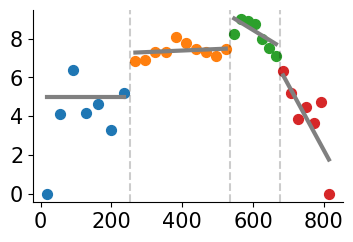

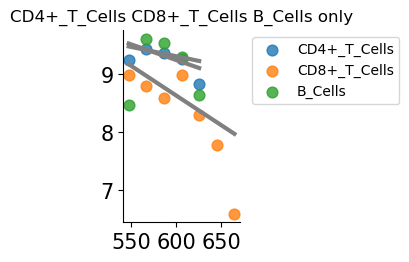

In [127]:
gene_name='SELL'
print(f'gene {gene_name}, continuous gradients {cont_genes_ct[gene_name]}')

binning_and_plotting.plot_gene_pwlinear(gene_name, pw_fit_dict, gaston_labels, gaston_isodepth, 
                                        binning_output, cell_type_list=None, pt_size=50, colors=None, 
                                        linear_fit=True, ticksize=15, figsize=(4,2.5), offset=10**6, lw=3,
                                       domain_boundary_plotting=True)
# plt.ylim((1.5,8.5))

# show cell type-specific functions in domain 1 (granule)
domain=2
cts=domain_cts[domain]
#remove stromal
cts=[x for x in cts if x != 'Stromal']

binning_and_plotting.plot_gene_pwlinear(gene_name, pw_fit_dict, gaston_labels, gaston_isodepth, binning_output,
                                        cell_type_list=cts,ct_colors=None, spot_threshold=0.05, pt_size=60, 
                                        colors=None, linear_fit=True, domain_list=[domain],ticksize=15, 
                                        figsize=(1.5,2.5), offset=10**6, lw=3, alpha=0.8,show_lgd=True)
cts_list=' '.join(map(str, cts))
plt.title(f'{cts_list} only')

gene TCL1A, continuous gradients [(2, 'Stromal'), (2, 'CD4+_T_Cells'), (2, 'CD8+_T_Cells'), (2, 'B_Cells')]


Text(0.5, 1.0, 'CD4+_T_Cells CD8+_T_Cells B_Cells only')

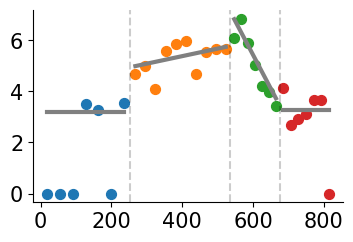

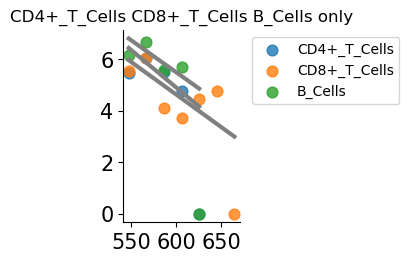

In [128]:
gene_name='TCL1A'
print(f'gene {gene_name}, continuous gradients {cont_genes_ct[gene_name]}')

binning_and_plotting.plot_gene_pwlinear(gene_name, pw_fit_dict, gaston_labels, gaston_isodepth, 
                                        binning_output, cell_type_list=None, pt_size=50, colors=None, 
                                        linear_fit=True, ticksize=15, figsize=(4,2.5), offset=10**6, lw=3,
                                       domain_boundary_plotting=True)
# plt.ylim((1.5,8.5))

# show cell type-specific functions in domain 1 (granule)
domain=2
cts=domain_cts[domain]
#remove stromal
cts=[x for x in cts if x != 'Stromal']

binning_and_plotting.plot_gene_pwlinear(gene_name, pw_fit_dict, gaston_labels, gaston_isodepth, binning_output,
                                        cell_type_list=cts,ct_colors=None, spot_threshold=0.05, pt_size=60, 
                                        colors=None, linear_fit=True, domain_list=[domain],ticksize=15, 
                                        figsize=(1.5,2.5), offset=10**6, lw=3, alpha=0.8,show_lgd=True)
cts_list=' '.join(map(str, cts))
plt.title(f'{cts_list} only')